# Comparative ANN Experiment as Interpretted from aforementioned research paper on The NK model using N=20 K=10


# Project Imports...

In [4]:
import sys
import os
from pathlib import Path
import random
import numpy as np
import pandas as pd

project_root = Path.cwd().parent
sys.path.append(str(project_root))

In [5]:
#get model
from src.models import ANN
#get experiment
from src.experiments import ann_experiments
#get data
from src.datasets import NK


# Package Imports...

In [6]:
import torch
import torch.nn as nn
from torchsummary import summary
import importlib
import matplotlib.pyplot as plt

# Model output...

In [7]:
#count how many params of the model...

#just to make sure we are getting the most current file version
importlib.reload(ANN)

device = torch.device('cpu')
#using the standard example architecture configuration as per Bull's paper for parameter counting (3-node gemone input and 2 nodes in the hidden layer)
model = ANN.ANN(3,2).to(device)

for name, param in model.named_parameters():
    print(f"{name:20} {tuple(param.shape)} -> {param.numel()}")

print(sum(p.numel() for p in model.parameters()))

hidden.weight        (2, 3) -> 6
hidden.bias          (2,) -> 2
decoder.weight       (3, 2) -> 6
decoder.bias         (3,) -> 3
output.weight        (1, 2) -> 2
output.bias          (1,) -> 1
20


# Training...

In [ ]:
importlib.reload(ann_experiments)
importlib.reload(ANN)

all_encoder_histories = []
all_task_histories = []


for seed in range(10):
    #run training and evaluation

    #get data
    NK_data_train = NK.NKLandscape.get_dataset(N=20,K=10,n_samples=1000,seed=seed)

    model, training_history = ann_experiments.train_ANN(
        NK_data_train,
        n_epochs=10000,
        batch_size=1000,
        USE_GPU=False,
        fold_id=None,
        metrics_dict=None,
        hill_climb=True,
        seed=seed
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])

Streaming output truncated to the last 5000 lines.
Epoch [7501/10000], Encoder Training Loss: 0.9797
Epoch [7501/10000], Regression Training Loss: 0.0053
Epoch [7502/10000], Encoder Training Loss: 0.9797
Epoch [7502/10000], Regression Training Loss: 0.0053
Epoch [7503/10000], Encoder Training Loss: 0.9797
Epoch [7503/10000], Regression Training Loss: 0.0053
Epoch [7504/10000], Encoder Training Loss: 0.9797
Epoch [7504/10000], Regression Training Loss: 0.0053
Epoch [7505/10000], Encoder Training Loss: 0.9797
Epoch [7505/10000], Regression Training Loss: 0.0053
Epoch [7506/10000], Encoder Training Loss: 0.9797
Epoch [7506/10000], Regression Training Loss: 0.0053
Epoch [7507/10000], Encoder Training Loss: 0.9797
Epoch [7507/10000], Regression Training Loss: 0.0053
Epoch [7508/10000], Encoder Training Loss: 0.9797
Epoch [7508/10000], Regression Training Loss: 0.0053
Epoch [7509/10000], Encoder Training Loss: 0.9797
Epoch [7509/10000], Regression Training Loss: 0.0053
Epoch [7510/10000], En

In [16]:
importlib.reload(ann_experiments)
importlib.reload(ANN)

all_encoder_histories = []
all_task_histories = []


for seed in range(10):
    #run training and evaluation

    #get data
    NK_data_train = NK.NKLandscape.get_dataset(N=20,K=10,n_samples=1000,seed=seed)

    model, training_history = ann_experiments.train_ANN(
        NK_data_train,
        n_epochs=10000,
        batch_size=1000,
        hill_climb=True,
        seed=seed
    )

    all_encoder_histories.append(training_history["encoder_train_loss"])
    all_task_histories.append(training_history["task_train_loss"])

Loading NK dataset...
input dims are 20
Epoch [1/10000], Encoder Training Loss: 1.1931
Epoch [1/10000], Regression Training Loss: 0.0680
Epoch [2/10000], Encoder Training Loss: 1.1931
Epoch [2/10000], Regression Training Loss: 0.0680
Epoch [3/10000], Encoder Training Loss: 1.1931
Epoch [3/10000], Regression Training Loss: 0.0527
Epoch [4/10000], Encoder Training Loss: 1.1931
Epoch [4/10000], Regression Training Loss: 0.0505
Epoch [5/10000], Encoder Training Loss: 1.1931
Epoch [5/10000], Regression Training Loss: 0.0505
Epoch [6/10000], Encoder Training Loss: 1.1931
Epoch [6/10000], Regression Training Loss: 0.0505
Epoch [7/10000], Encoder Training Loss: 1.1931
Epoch [7/10000], Regression Training Loss: 0.0247
Epoch [8/10000], Encoder Training Loss: 1.1931
Epoch [8/10000], Regression Training Loss: 0.0247
Epoch [9/10000], Encoder Training Loss: 1.1931
Epoch [9/10000], Regression Training Loss: 0.0247
Epoch [10/10000], Encoder Training Loss: 1.1912
Epoch [10/10000], Regression Training L

In [17]:
ann_encoder_losses = np.array(all_encoder_histories)
ann_encoder_mean_loss = ann_encoder_losses.mean(axis=0)
ann_encoder_std_loss  = ann_encoder_losses.std(axis=0)

In [18]:
ann_task_losses = np.array(all_task_histories)
ann_task_mean_loss = ann_task_losses.mean(axis=0)
ann_task_std_loss  = ann_task_losses.std(axis=0)

In [22]:
project_root

WindowsPath('c:/Users/henry/Desktop/neurons_as_autoencoders')

In [23]:
results_dir = project_root / "results"

In [32]:
np.savez(
    results_dir /"ann_hillclimb1_10seeds.npz",
    encoder_mean_loss=ann_encoder_mean_loss,
    encoder_std_loss=ann_encoder_std_loss,
    task_mean_loss=ann_task_mean_loss,
    task_std_loss=ann_task_std_loss,
    encoder_losses=ann_encoder_losses,
    task_losses= ann_task_losses
)

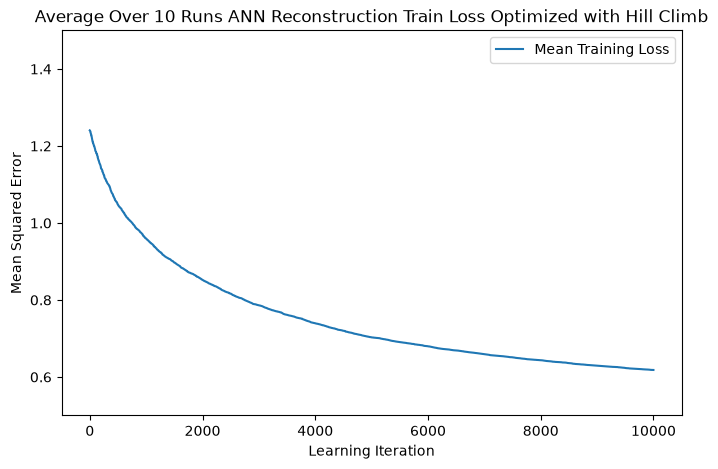

In [29]:
epochs = np.arange(len(ann_encoder_mean_loss))

plt.figure(figsize=(8,5))

plt.plot(epochs, ann_encoder_mean_loss,label="Mean Training Loss")



plt.xlabel("Learning Iteration")
plt.ylabel("Mean Squared Error")
plt.legend()
plt.ylim(bottom=0.5,top=1.5)
plt.title("Average Over 10 Runs ANN Reconstruction Train Loss Optimized with Hill Climb")
plt.show()

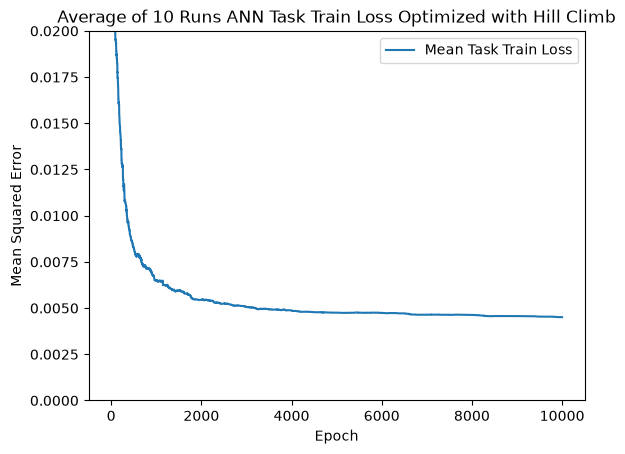

In [30]:
plt.plot(ann_task_mean_loss, label="Mean Task Train Loss")
#plt.plot(training_history["val_loss"], label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Mean Squared Error")
plt.legend()
plt.title("Average of 10 Runs ANN Task Train Loss Optimized with Hill Climb")
plt.ylim(0,0.02)
plt.show()

In [31]:
len(ann_task_mean_loss)

10000

# Results themselves are plotted and compared within the nan_experiments.ipynb 